### Imports utiles

In [1]:
import os
import matplotlib.pyplot as plt
os.environ["KERAS_BACKEND"] = "tensorflow"

import numpy as np
import tensorflow as tf
import keras
from keras import layers

"""
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)
"""

2024-04-04 11:10:29.609992: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-04 11:10:30.650084: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


'\nfrom tensorflow.compat.v1 import ConfigProto\nfrom tensorflow.compat.v1 import InteractiveSession\nconfig = ConfigProto()\nconfig.gpu_options.allow_growth = True\nsession = InteractiveSession(config=config)\n'

### Implémentation du modèle

In [2]:
class Sampling(layers.Layer):
    #Uses (z_mean, z_log_var) to sample z, the vector encoding a digit.

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        print("Batch used in the Sampling function")
        print(batch)
        dim = tf.shape(z_mean)[1]
        epsilon = tf.random.normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

latent_dim = 500

encoder_inputs = keras.Input(shape=(64, 64, 3))
x = layers.Conv2D(32, 4, activation="relu", strides=2, padding="same")(encoder_inputs)
x = layers.Conv2D(32, 3, activation="relu", padding="same")(x)
x = layers.Conv2D(64, 4, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2D(64, 3, activation="relu", padding="same")(x)
x = layers.Conv2D(128, 4, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2D(128, 3, activation="relu", padding="same")(x)
x = layers.Conv2D(256, 4, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2D(256, 3, activation="relu", padding="same")(x)
x = layers.Flatten()(x)
x = layers.Dense(latent_dim, activation="relu")(x)
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
z = Sampling()([z_mean, z_log_var])
encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
encoder.summary()

latent_inputs = keras.Input(shape=(latent_dim,))
x = layers.Dense(4 * 4 * 256, activation="relu")(latent_inputs)
x = layers.Reshape((4, 4, 256))(x)
x = layers.Conv2DTranspose(256, 4, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(128, 4, activation="relu",strides=2, padding="same")(x)
x = layers.Conv2DTranspose(128, 3, activation="relu", padding="same")(x)
x = layers.Conv2DTranspose(64, 4, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(64, 3, activation="relu", padding="same")(x)
x = layers.Conv2DTranspose(32, 4, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(32, 3, activation="relu", padding="same")(x)
decoder_outputs = layers.Conv2DTranspose(3, 3, activation="sigmoid", padding="same")(x)
decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

@tf.keras.utils.register_keras_serializable()
class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super().__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = keras.metrics.Mean(
            name="reconstruction_loss"
        )
        self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")
        # self.kl_list = []
        #self.reconstruction_list = []

    # def get_loss_list(self):
    #     return [self.kl_list]

    def get_config(self):
        #, "total_loss":self.total_loss_tracker,"reconstruction_loss" :self.reconstruction_loss_tracker, "kl_loss":self.kl_loss_tracker
        return {"encoder": self.encoder, "decoder":self.decoder}

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
        ]

    def train_step(self, data):
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(data)
            reconstruction = self.decoder(z)
            reconstruction_loss = tf.reduce_mean(
                tf.reduce_sum(
                    keras.losses.binary_crossentropy(data, reconstruction),
                    axis=(1, 2),
                )
            )
            
            #kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
            #kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))

            # KL loss formula found on: https://medium.com/@outerrencedl/variational-autoencoder-and-a-bit-kl-divergence-with-pytorch-ce04fd55d0d7                
            kl_loss = tf.reduce_sum(tf.square(tf.exp(z_log_var)) + tf.square(z_mean) - z_log_var - 0.5, axis=1)
            total_loss =reconstruction_loss + kl_loss/2
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }
    def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

vae_rebuild = VAE(encoder, decoder)

2024-04-04 01:41:20.703715: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-04-04 01:41:20.919493: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-04-04 01:41:20.919547: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-04-04 01:41:20.926997: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-04-04 01:41:20.927066: I external/local_xla/xla/stream_executor

Batch used in the Sampling function
Tensor("strided_slice:0", shape=(), dtype=int32)


Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 64, 64, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 32, 32,    │      1,568 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 32, 32,    │      9,248 │ conv2d[0][0]      │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 16, 16,    │     32,832 │ conv2d_1[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 16, 16,    │     36,928 │ conv2d_2[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 8, 8, 128) │    131,200 │ conv2d_3[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 8, 8, 128) │    147,584 │ conv2d_4[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 4, 4, 256) │    524,544 │ conv2d_5[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 4, 4, 256) │    590,080 │ conv2d_6[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 4096)      │          0 │ conv2d_7[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 500)       │  2,048,500 │ flatten[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_mean (Dense)      │ (None, 500)       │    250,500 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_log_var (Dense)   │ (None, 500)       │    250,500 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sampling (Sampling) │ (None, 500)       │          0 │ z_mean[0][0],     │
│                     │                   │            │ z_log_var[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 4,023,484 (15.35 MB)

 Trainable params: 4,023,484 (15.35 MB)

 Non-trainable params: 0 (0.00 B)

Model: "decoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 500)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4096)           │     2,052,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 8, 8, 256)      │     1,048,832 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 16, 16, 128)    │       524,416 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 16, 16, 128)    │       147,584 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_3              │ (None, 32, 32, 64)     │       131,136 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_4              │ (None, 32, 32, 64)     │        36,928 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_5              │ (None, 64, 64, 32)     │        32,800 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_6              │ (None, 64, 64, 32)     │         9,248 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_7              │ (None, 64, 64, 3)      │           867 │
│ (Conv2DTranspose)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,983,907 (15.20 MB)

 Trainable params: 3,983,907 (15.20 MB)

 Non-trainable params: 0 (0.00 B)

### 25 epochs sur le train de 200 * 128 (25600 photos) avec des batches de 64

2024-04-04 01:26:57.712627: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907


Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


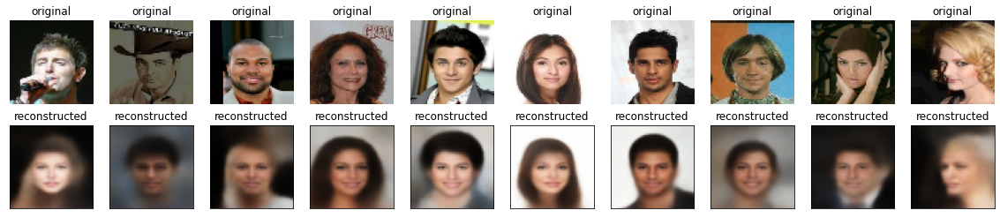

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


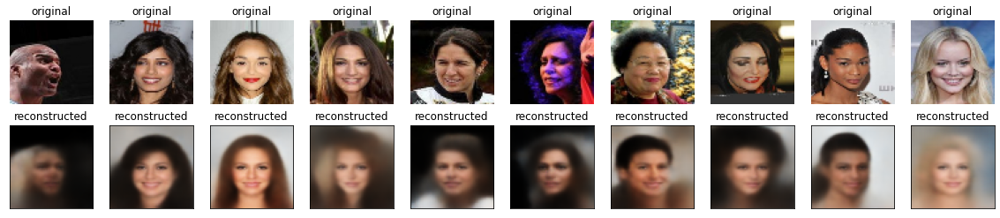

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


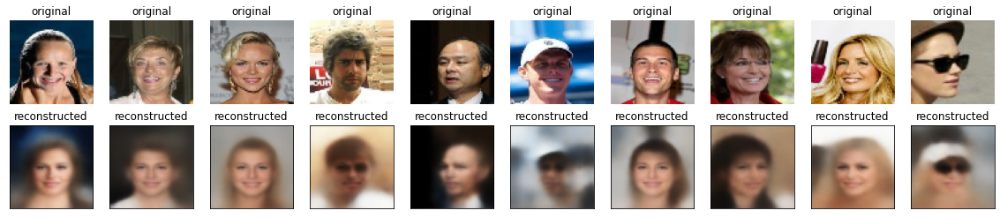

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


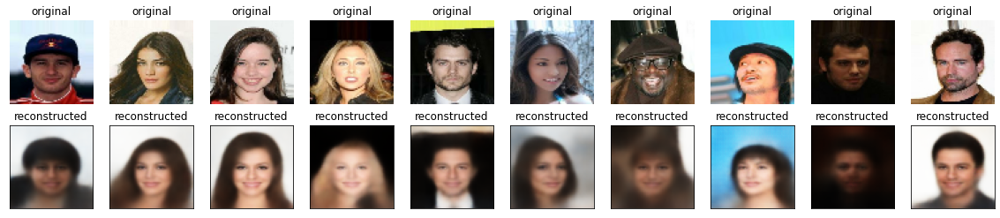

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


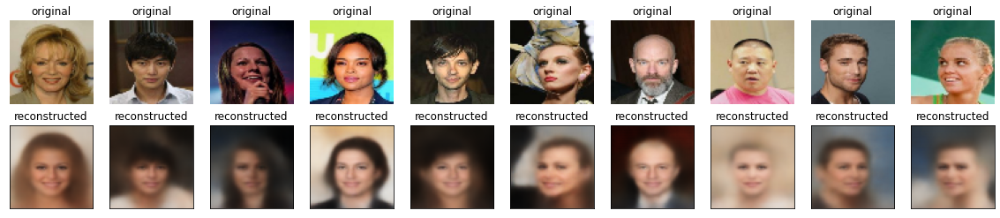

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


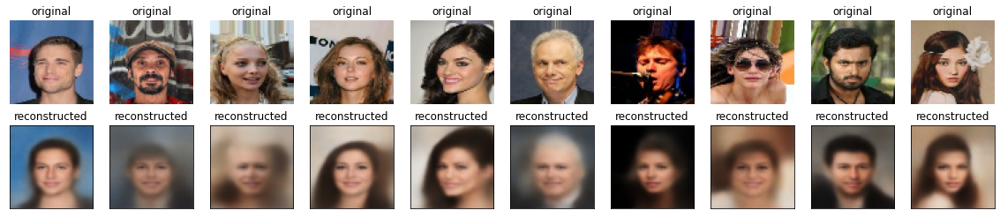

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


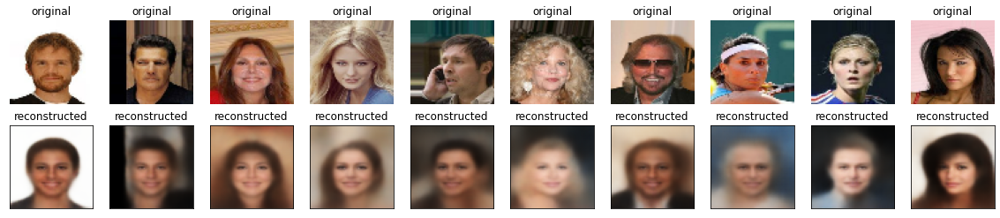

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


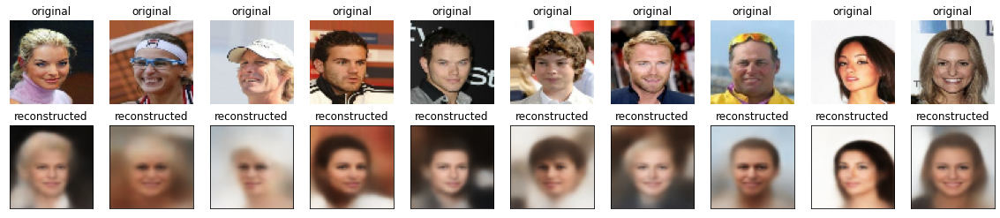

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


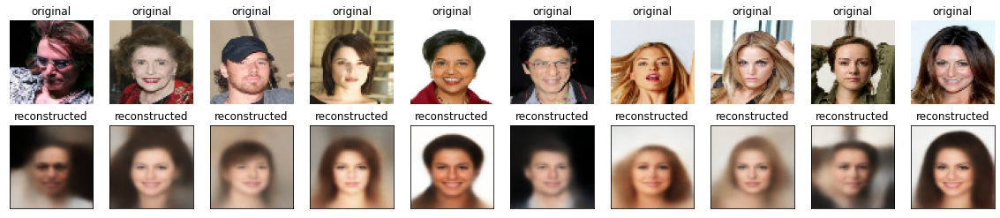

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


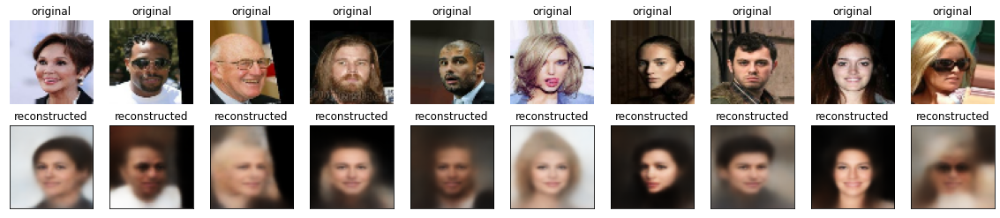

In [3]:
vae_rebuild.load_weights('saved_model/04_04/best_model_04_04.weights.h5')

celeba = np.load("../img/celeba_npy/val_ds_final.npy")/255

# constantes
batch_size= 128
img_height= 64
img_width= 64

for offset in [i*100 for i in range(0,10)]:
    z_mean,_,x_encoded = vae_rebuild.encoder(celeba[offset:offset+20]) # i added this line
    x_decoded = vae_rebuild.decoder(x_encoded) # original had predict

    plt.figure(figsize=(20, 4))
    for i in range(10):
        # display original
        ax = plt.subplot(2, 10, i + 1)
        plt.title("original")
        plt.imshow(celeba[offset+i])
        plt.axis("off")
    
        # display reconstruction
        bx = plt.subplot(2, 10, i + 10 + 1)
        plt.title("reconstructed")
        plt.imshow(x_decoded[i])
        bx.get_xaxis().set_visible(False)
        bx.get_yaxis().set_visible(False)
    plt.show()

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


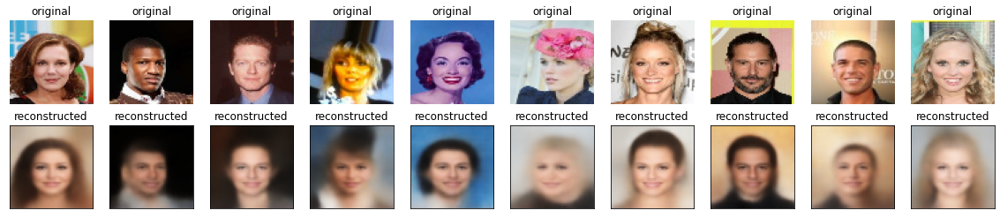

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


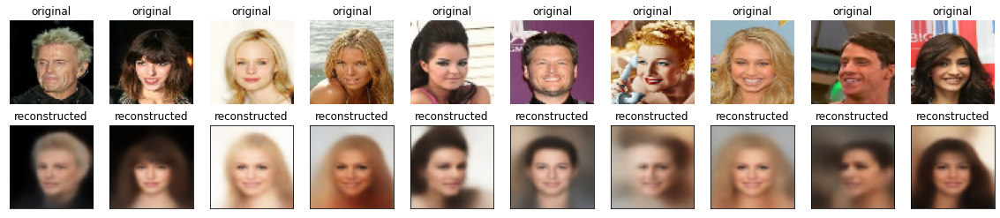

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


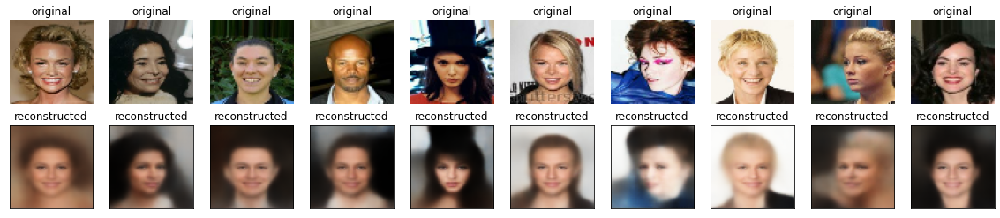

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


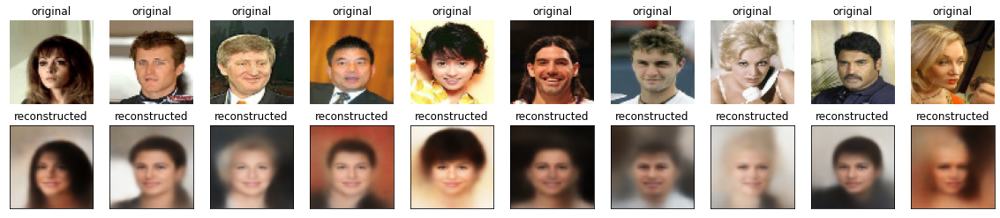

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


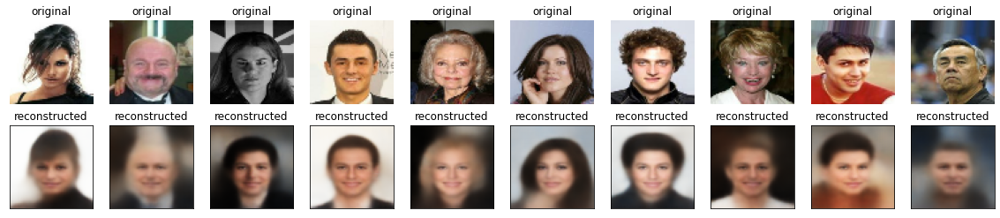

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


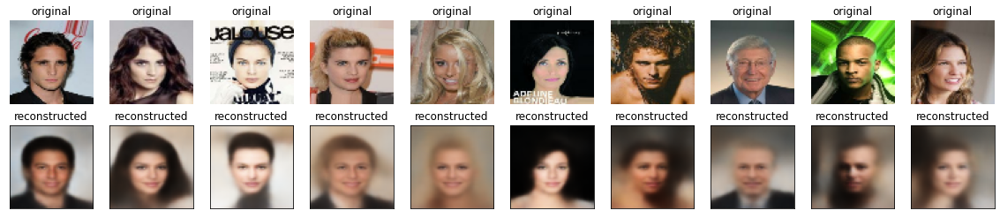

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


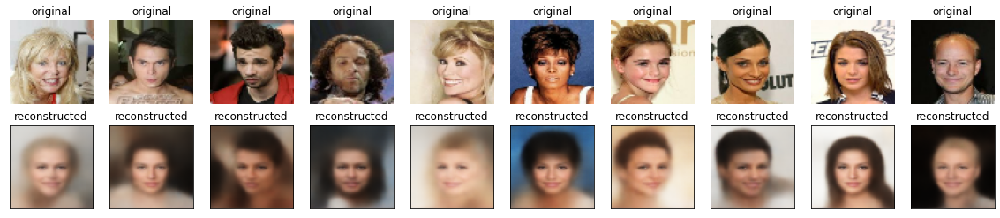

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


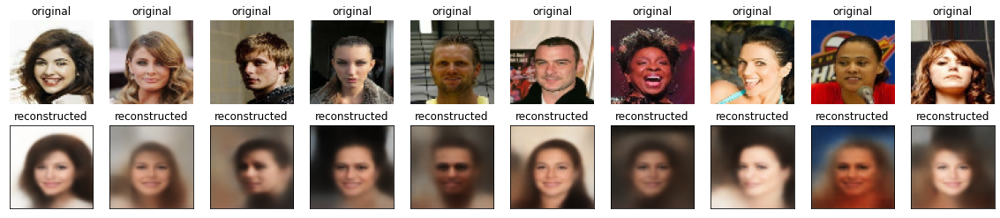

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


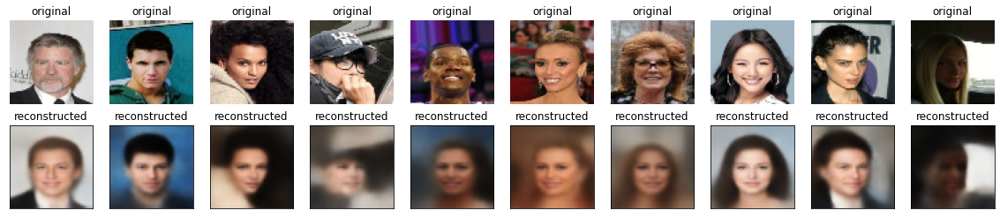

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


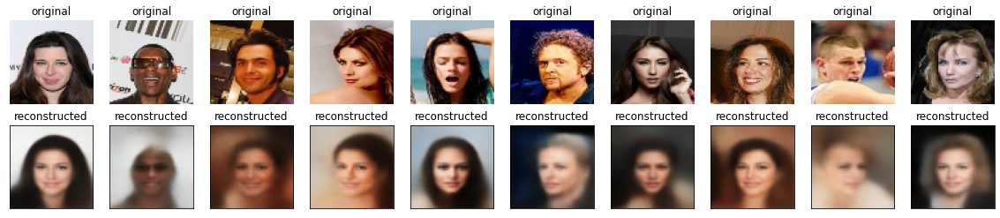

In [5]:
vae_rebuild.load_weights('saved_model/04_04/best_model_04_04.weights.h5')

celeba = np.load("../img/celeba_npy/train_ds_final_200.npy")/255

# constantes
batch_size= 128
img_height= 64
img_width= 64

for offset in [i*100 for i in range(0,10)]:
    z_mean,_,x_encoded = vae_rebuild.encoder(celeba[offset:offset+20]) # i added this line
    x_decoded = vae_rebuild.decoder(x_encoded) # original had predict

    plt.figure(figsize=(20, 4))
    for i in range(10):
        # display original
        ax = plt.subplot(2, 10, i + 1)
        plt.title("original")
        plt.imshow(celeba[offset+i])
        plt.axis("off")
    
        # display reconstruction
        bx = plt.subplot(2, 10, i + 10 + 1)
        plt.title("reconstructed")
        plt.imshow(x_decoded[i])
        bx.get_xaxis().set_visible(False)
        bx.get_yaxis().set_visible(False)
    plt.show()

### On reprend les mêmes params que le meilleur modèle (1000 epochs sur batches de 64 sur les 12000 images) mais on augmente la latent dim à 1024

In [5]:
class Sampling(layers.Layer):
    #Uses (z_mean, z_log_var) to sample z, the vector encoding a digit.

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        print("Batch used in the Sampling function")
        print(batch)
        dim = tf.shape(z_mean)[1]
        epsilon = tf.random.normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

latent_dim = 1024

encoder_inputs = keras.Input(shape=(64, 64, 3))
x = layers.Conv2D(32, 4, activation="relu", strides=2, padding="same")(encoder_inputs)
x = layers.Conv2D(32, 3, activation="relu", padding="same")(x)
x = layers.Conv2D(64, 4, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2D(64, 3, activation="relu", padding="same")(x)
x = layers.Conv2D(128, 4, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2D(128, 3, activation="relu", padding="same")(x)
x = layers.Conv2D(256, 4, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2D(256, 3, activation="relu", padding="same")(x)
x = layers.Flatten()(x)
x = layers.Dense(latent_dim, activation="relu")(x)
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
z = Sampling()([z_mean, z_log_var])
encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
encoder.summary()

latent_inputs = keras.Input(shape=(latent_dim,))
x = layers.Dense(4 * 4 * 256, activation="relu")(latent_inputs)
x = layers.Reshape((4, 4, 256))(x)
x = layers.Conv2DTranspose(256, 4, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(128, 4, activation="relu",strides=2, padding="same")(x)
x = layers.Conv2DTranspose(128, 3, activation="relu", padding="same")(x)
x = layers.Conv2DTranspose(64, 4, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(64, 3, activation="relu", padding="same")(x)
x = layers.Conv2DTranspose(32, 4, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(32, 3, activation="relu", padding="same")(x)
decoder_outputs = layers.Conv2DTranspose(3, 3, activation="sigmoid", padding="same")(x)
decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

@tf.keras.utils.register_keras_serializable()
class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super().__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = keras.metrics.Mean(
            name="reconstruction_loss"
        )
        self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")
        # self.kl_list = []
        #self.reconstruction_list = []

    # def get_loss_list(self):
    #     return [self.kl_list]

    def get_config(self):
        #, "total_loss":self.total_loss_tracker,"reconstruction_loss" :self.reconstruction_loss_tracker, "kl_loss":self.kl_loss_tracker
        return {"encoder": self.encoder, "decoder":self.decoder}

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
        ]

    def train_step(self, data):
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(data)
            reconstruction = self.decoder(z)
            reconstruction_loss = tf.reduce_mean(
                tf.reduce_sum(
                    keras.losses.binary_crossentropy(data, reconstruction),
                    axis=(1, 2),
                )
            )
            
            #kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
            #kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))

            # KL loss formula found on: https://medium.com/@outerrencedl/variational-autoencoder-and-a-bit-kl-divergence-with-pytorch-ce04fd55d0d7                
            kl_loss = tf.reduce_sum(tf.square(tf.exp(z_log_var)) + tf.square(z_mean) - z_log_var - 0.5, axis=1)
            total_loss =reconstruction_loss + kl_loss/2
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }
    def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

vae_rebuild = VAE(encoder, decoder)

Batch used in the Sampling function
Tensor("strided_slice:0", shape=(), dtype=int32)


Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 64, 64, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 32, 32,    │      1,568 │ input_layer_2[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 32, 32,    │      9,248 │ conv2d_8[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_10 (Conv2D)  │ (None, 16, 16,    │     32,832 │ conv2d_9[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_11 (Conv2D)  │ (None, 16, 16,    │     36,928 │ conv2d_10[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_12 (Conv2D)  │ (None, 8, 8, 128) │    131,200 │ conv2d_11[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_13 (Conv2D)  │ (None, 8, 8, 128) │    147,584 │ conv2d_12[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_14 (Conv2D)  │ (None, 4, 4, 256) │    524,544 │ conv2d_13[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_15 (Conv2D)  │ (None, 4, 4, 256) │    590,080 │ conv2d_14[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_1 (Flatten) │ (None, 4096)      │          0 │ conv2d_15[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 1024)      │  4,195,328 │ flatten_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_mean (Dense)      │ (None, 1024)      │  1,049,600 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_log_var (Dense)   │ (None, 1024)      │  1,049,600 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sampling_1          │ (None, 1024)      │          0 │ z_mean[0][0],     │
│ (Sampling)          │                   │            │ z_log_var[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 7,768,512 (29.63 MB)

 Trainable params: 7,768,512 (29.63 MB)

 Non-trainable params: 0 (0.00 B)

Model: "decoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 4096)           │     4,198,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_1 (Reshape)             │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_8              │ (None, 8, 8, 256)      │     1,048,832 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_9              │ (None, 16, 16, 128)    │       524,416 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_10             │ (None, 16, 16, 128)    │       147,584 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_11             │ (None, 32, 32, 64)     │       131,136 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_12             │ (None, 32, 32, 64)     │        36,928 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_13             │ (None, 64, 64, 32)     │        32,800 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_14             │ (None, 64, 64, 32)     │         9,248 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_15             │ (None, 64, 64, 3)      │           867 │
│ (Conv2DTranspose)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,130,211 (23.38 MB)

 Trainable params: 6,130,211 (23.38 MB)

 Non-trainable params: 0 (0.00 B)

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


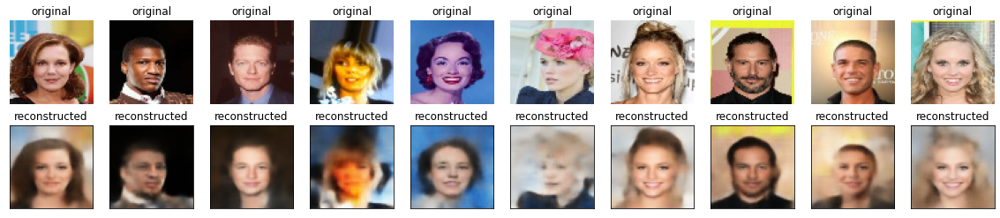

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


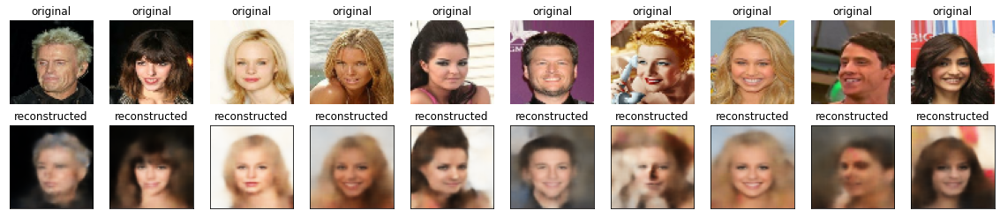

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


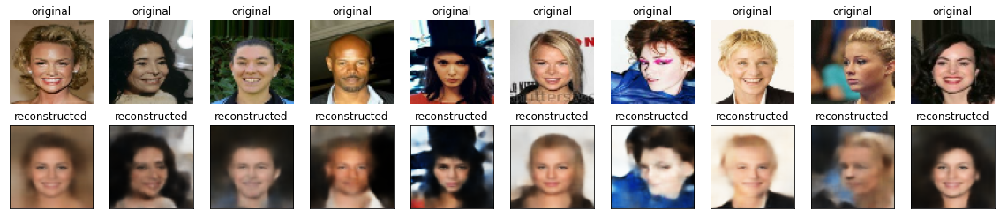

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


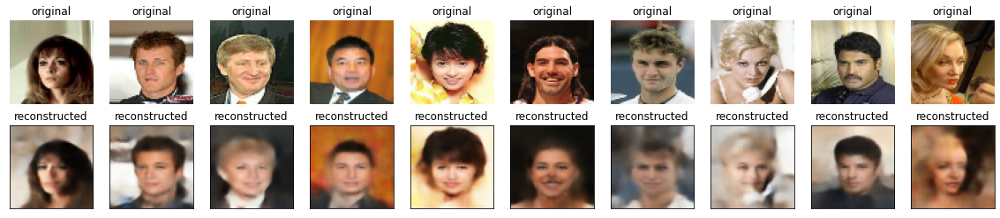

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


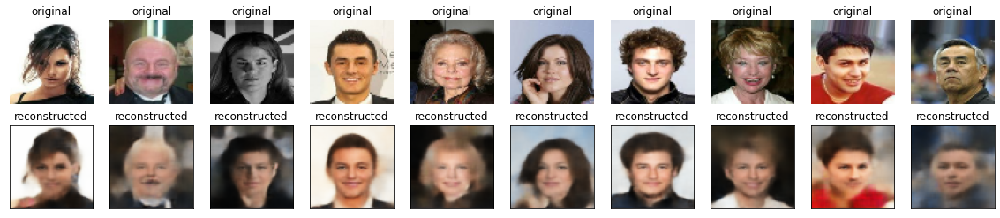

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


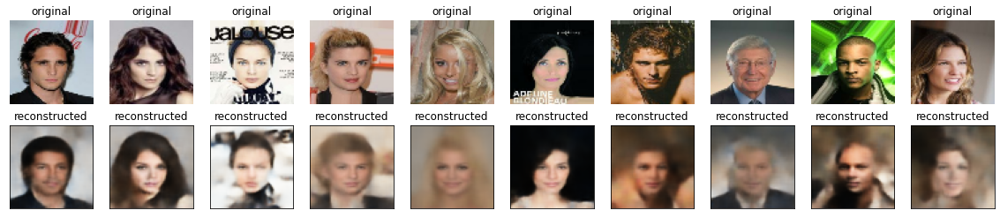

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


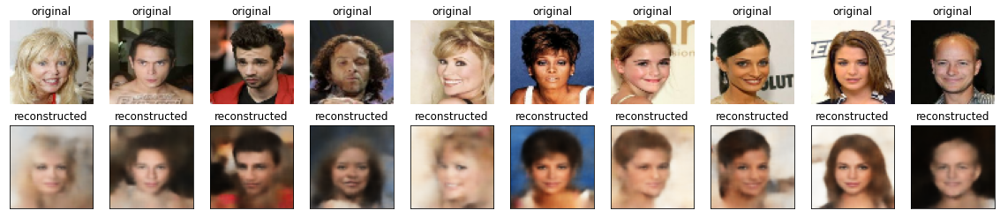

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


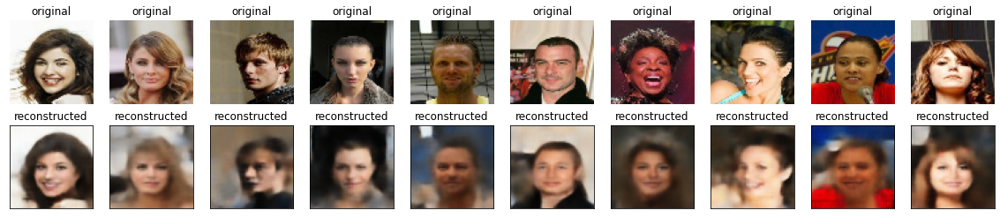

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


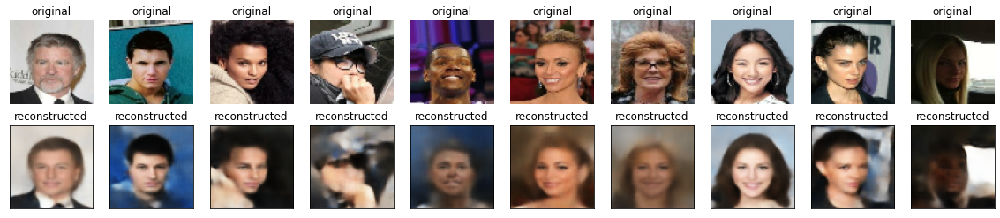

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


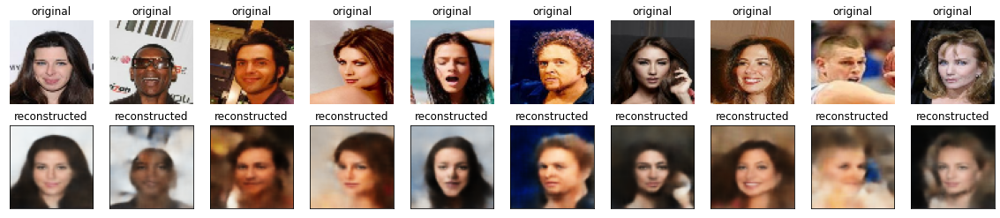

In [8]:
vae_rebuild.load_weights('saved_model/04_04/best_model_04_04.weights.h5')

celeba = np.load("../img/celeba_npy/train_ds_final_100.npy")

# constantes
batch_size= 64
img_height= 64
img_width= 64

for offset in [i*100 for i in range(0,10)]:
    z_mean,_,x_encoded = vae_rebuild.encoder(celeba[offset:offset+20]) # i added this line
    x_decoded = vae_rebuild.decoder(x_encoded) # original had predict

    plt.figure(figsize=(20, 4))
    for i in range(10):
        # display original
        ax = plt.subplot(2, 10, i + 1)
        plt.title("original")
        plt.imshow(celeba[offset+i])
        plt.axis("off")
    
        # display reconstruction
        bx = plt.subplot(2, 10, i + 10 + 1)
        plt.title("reconstructed")
        plt.imshow(x_decoded[i])
        bx.get_xaxis().set_visible(False)
        bx.get_yaxis().set_visible(False)
    plt.show()

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


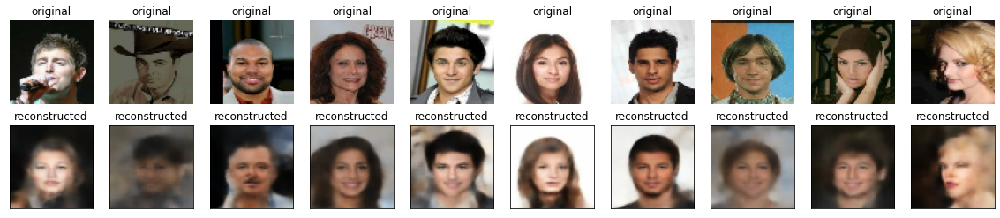

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


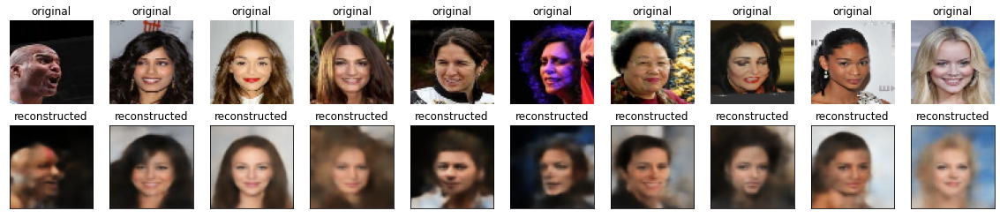

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


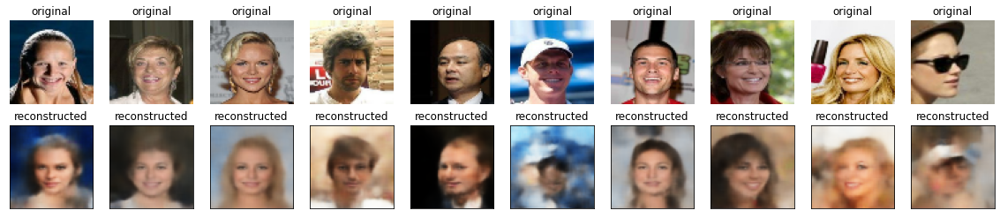

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


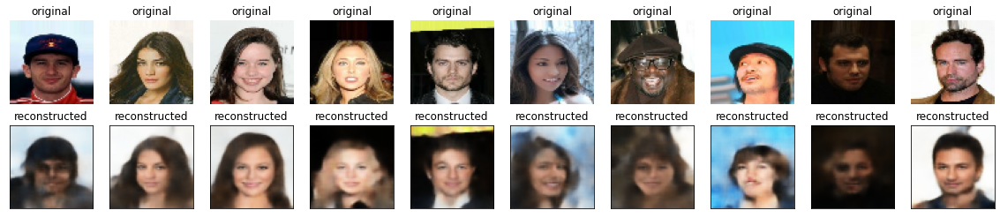

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


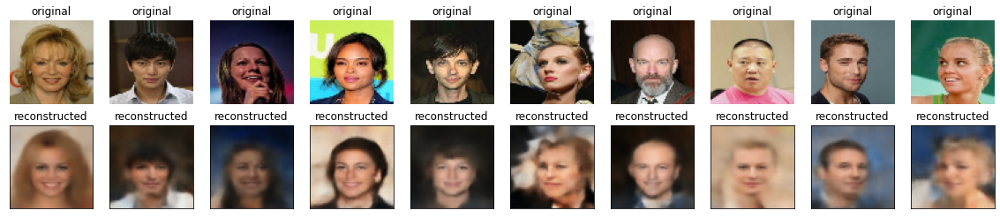

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


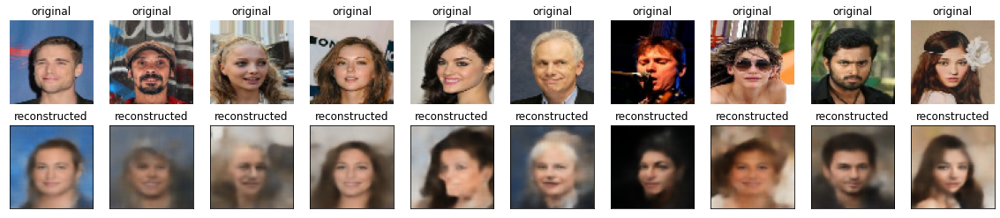

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


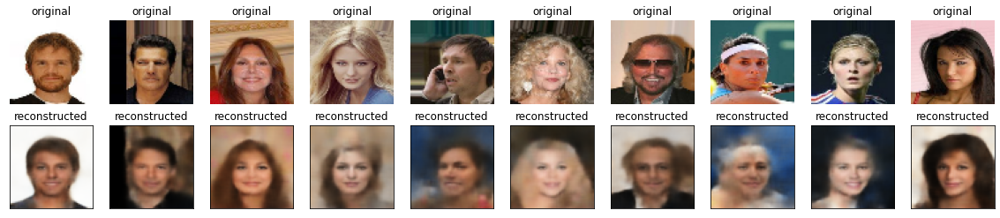

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


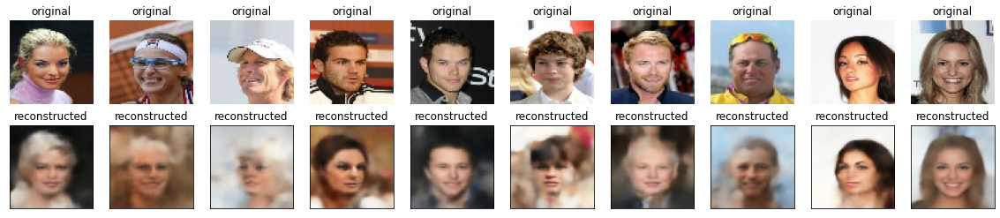

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


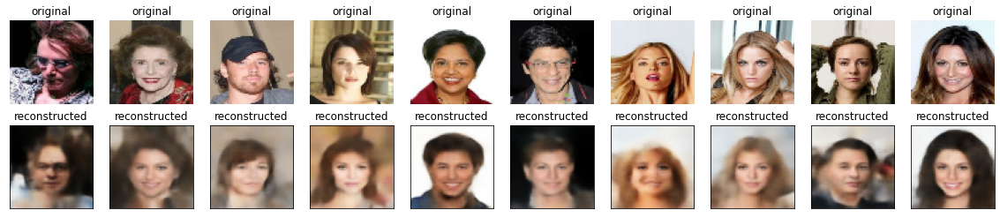

Batch used in the Sampling function
tf.Tensor(20, shape=(), dtype=int32)


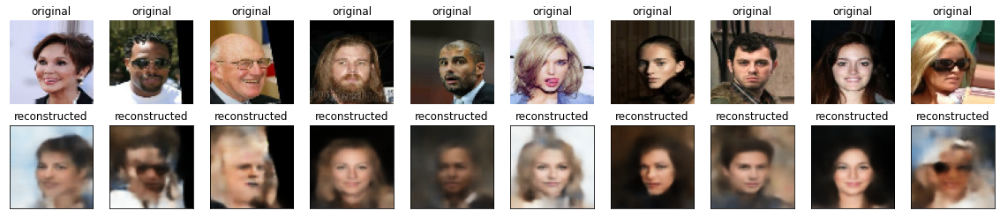

In [7]:
vae_rebuild.load_weights('saved_model/04_04/best_model_04_04.weights.h5')

celeba = np.load("../img/celeba_npy/val_ds_final.npy")/255

# constantes
batch_size= 64
img_height= 64
img_width= 64

for offset in [i*100 for i in range(0,10)]:
    z_mean,_,x_encoded = vae_rebuild.encoder(celeba[offset:offset+20]) # i added this line
    x_decoded = vae_rebuild.decoder(x_encoded) # original had predict

    plt.figure(figsize=(20, 4))
    for i in range(10):
        # display original
        ax = plt.subplot(2, 10, i + 1)
        plt.title("original")
        plt.imshow(celeba[offset+i])
        plt.axis("off")
    
        # display reconstruction
        bx = plt.subplot(2, 10, i + 10 + 1)
        plt.title("reconstructed")
        plt.imshow(x_decoded[i])
        bx.get_xaxis().set_visible(False)
        bx.get_yaxis().set_visible(False)
    plt.show()